# **Neural Style Transfer**
**GR5242 Final Project, Sung In Cho (sc4393)**

# **Overview**
In this project, we will use deep learning technique to compose images in a style of another image. This method is called "Neural Style Transfer". For this project, I mainly referred to the paper, [Image Style Transfer Using Convolutional Neural Networks](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf) (Gatys et al.).

Neural style transfer blends two images, a content image and a style reference image, to make an output image that looks like the content image painted in the style of the style reference image. An optimization technique is used to the output image to match the content statistics of the content image and the style statistics of the style reference image (using respective loss functions). These statistics are extracted from the above images using a convolutional network.

I also tried the style transfer without any paired image, with just target image and the source of the style. For example, transferring a style of painting of Monet like a real photograph. For this advanced project, I referred to the paper, [Unpaired Image-to-Image Translation
using Cycle-Consistent Adversarial Networks](https://arxiv.org/pdf/1703.10593.pdf) (Zhu et al.). 

This paper proposes a method that can capture the characteristics of one image domain and transfer these characteristics into another image domain without any paired training examples. It is using conditional GAN (CycleGAN) to demonstrate unpaired image to image translation as it uses a cycle consistency loss to enable training without the need for paired data.

# **1. Neural Style Transfer**

## **1-1. Setup**

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass

import tensorflow as tf

TensorFlow 2.x selected.


In [0]:
import IPython.display as display # displaying API

import matplotlib.pyplot as plt # MATLAB-like way of plotting
import matplotlib as mpl # MATLAB-like way of plotting
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image # Python Imaging Library, import image and create new image
import time # handle time-related tasks
import functools # manipulate functions

## **1-2. Content and Style reference Images**

Downloading content images and style reference images

In [3]:
content_path1 = tf.keras.utils.get_file('night_proposal.jpg', 'https://drive.google.com/uc?export=view&id=1Z6w6KCeoC-Vsq93VbhhR2dt_w3h3g5EP')
content_path2 = tf.keras.utils.get_file('facing_wedding.jpg', 'https://drive.google.com/uc?export=view&id=1Q1Q8_RGjMHV2nipffs3AdoQfm4lAk7e-')
content_path3 = tf.keras.utils.get_file('my_dog.jpg', 'https://drive.google.com/uc?export=view&id=174lLWnzQlssrThSZpRaf202uHZY2w9rV')

style_path1 = tf.keras.utils.get_file('stray_night_vangogh.jpg','https://cdn.britannica.com/78/43678-050-F4DC8D93/Starry-Night-canvas-Vincent-van-Gogh-New-1889.jpg')
style_path2 = tf.keras.utils.get_file('scream_edvardmuch.jpg','https://i.pinimg.com/originals/81/65/0e/81650e58e917e072796efb29d182290a.jpg')
style_path3 = tf.keras.utils.get_file('Composition_VII_Wassily_Kandinsky.jpg','https://i.ebayimg.com/images/g/5vsAAOSw9mFWLODR/s-l300.jpg')

24576/23302 [===============================] - 0s 0us/step


Functions for translating images

In [0]:
def ten_img(ten):
  ten = ten*255
  ten = np.array(ten, dtype=np.uint8)
  ten = ten[0]
  return PIL.Image.fromarray(ten)

In [0]:
def img_load(img_path):
  max_d=512 # restrict maximum dimension of an image to 512 pixels
  img=tf.io.read_file(img_path)
  img=tf.image.decode_image(img, channels=3) # Detects extension of an image, and performs the appropriate operation to convert the input bytes string into a Tensor of type dtype.
  img=tf.image.convert_image_dtype(img, tf.float32)

  shape=tf.cast(tf.shape(img)[:-1], tf.float32) # Casts a tensor(shape(img)) to a new type.
  max_s=max(shape)
  scale=max_d/max_s

  scaled_shape=tf.cast(shape*scale, tf.int32)

  img=tf.image.resize(img, scaled_shape)
  img=img[tf.newaxis, :] # increasing dimension by column
  return img

In [0]:
def img_display(img, title=None):
  if len(img.shape) > 3:
    img = tf.squeeze(img, axis=0)

  plt.imshow(img)
  if title:
    plt.title(title)

#### **Content Images**

I wanted to give my wife a result of the project as a special gift.

* content image1:a picture of making proposal 

* content image2: a picture of having marriage 

* content image3: a picure of my dog in Korea

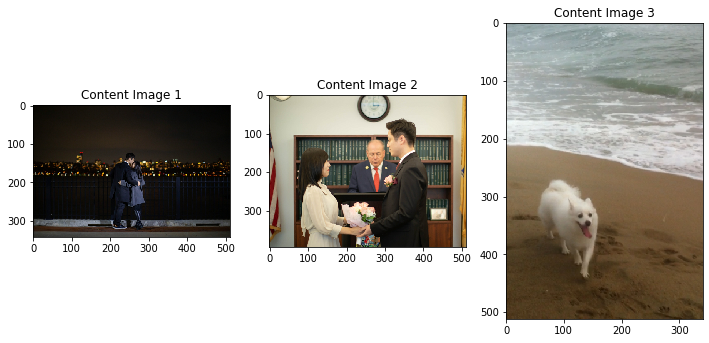

In [7]:
content_image1 = img_load(content_path1)
content_image2 = img_load(content_path2)
content_image3 = img_load(content_path3)

plt.subplot(131)
img_display(content_image1, 'Content Image 1')

plt.subplot(132)
img_display(content_image2, 'Content Image 2')

plt.subplot(133)
img_display(content_image3, 'Content Image 3')

#### **Style Images**

* style image1: Starry Night (Van Gogh) 

* style image2: Scream (Edvard Munch)

* style image3: Composition VII (Wassily Kandinsky)

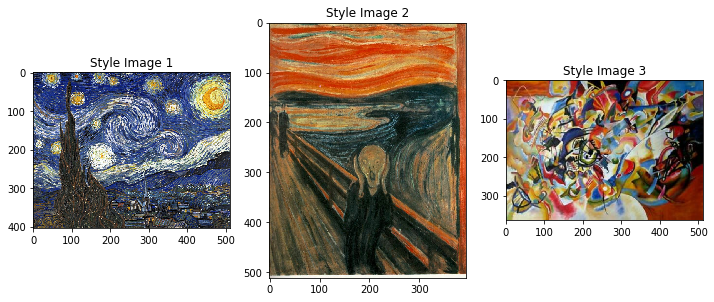

In [8]:
style_image1 = img_load(style_path1)
style_image2 = img_load(style_path2)
style_image3 = img_load(style_path3)

plt.subplot(131)
img_display(style_image1, 'Style Image 1')

plt.subplot(132)
img_display(style_image2, 'Style Image 2')

plt.subplot(133)
img_display(style_image3, 'Style Image 3')

## **1-3. Style Transfer example using TF-Hub**
We can simply do style transfer using the TensorFlow Hub module.

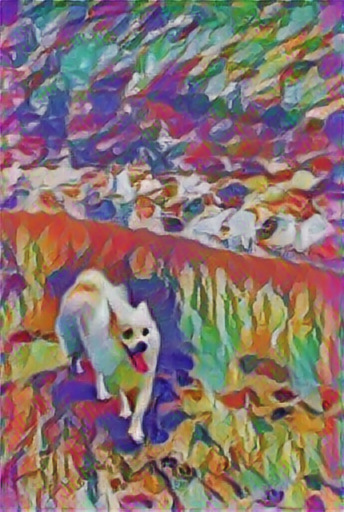

In [14]:
import tensorflow_hub as hub
TF_hub = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1')
ex_TF_hub = TF_hub(tf.constant(content_image3), tf.constant(style_image3))[0]
ten_img(ex_TF_hub)

##**1-4. Style Transfer using VGG19 network**
To see the simple example of style transfer, we checked the result of TensorFlow Hub module. Now we will use VGG19 network, a pretrained image classification network, to get the content and style features of the image (the first goal of this project). The network's first few layer activations represent low-level features (like edges and textures). The final few layers represent higher-level features (object parts; like wheels or eyes).

Loading a VGG19, and check a list of names of the layers

In [9]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
print()
for layer in vgg.layers:
  print(layer.name)

80142336/80134624 [==============================] - 6s 0us/step

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


As explained in [Image Style Transfer Using Convolutional Neural Networks](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf) (Gatys et al.), lower level layers maintain most of information of the input image. But higher level layers lose most of pixcel level information and maintain only semantic information of an image. Therefore, we will extract a **content feature** from a final few layers to extract the semantic information of the content image. 

To extract **style features** from an image, we use Gram matrix. Style and texture of the image should be unrelated to semantic information of the image. That's why we use Gram matrix which shows correlation between feature map of each layers. Therefore, in the case of style feature extraction, we must check correlation of multiple layers (not a single layer). By this method, we can get stationary information of multiple layers and see a restructured image using multiple images from each layers.

In [0]:
content_layer = ['block5_conv2'] # we will pull feature maps from 'block5_conv2' content layer

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'] # We will use these layers to extract style features

num_content_layer = len(content_layer)
num_style_layers = len(style_layers)

### **1-4-1. Build the model**

We can extract the intermediate layer values using the Keras functional API (tf.keras.applications).

**VGG19 model** 

In [0]:
def vgg19_model(layer_n):
  # pretrained VGG, trained on imagenet data
  vgg=tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable=False   
  outputs=[vgg.get_layer(name).output for name in layer_n]
  vgg_model=tf.keras.Model([vgg.input], outputs)
  return vgg_model

**Gram Matrix**

The style of an image can be described by the means and correlations across the different feature maps. Calculate a Gram matrix that includes this information by taking the outer product of the feature vector with itself at each location, and averaging that outer product over all locations. This Gram matrix can be calcualted for a particular layer as:

$$G^l_{cd} = \frac{\sum_{ij} F^l_{ijc}(x)F^l_{ijd}(x)}{IJ}$$



In [0]:
def gram_mat(tensor):
  gram = tf.linalg.einsum('tijc,tijd->tcd', tensor, tensor) # This function returns a tensor whose elements are defined by equation
  shape = tf.shape(tensor)
  denom = tf.cast(shape[1]*shape[2], tf.float32)
  return gram/(denom)

### **1-4-2. Feature Extraction**

Model that returns the style and content tensors

In [0]:
class Extract_Model(tf.keras.models.Model):
  def __init__(self, style, content):
    super(Extract_Model, self).__init__()
    self.vgg =  vgg19_model(style + content) # extract the intermediate layer values from vgg19 network
    self.vgg.trainable = False
    self.style = style
    self.n_style = len(style)
    self.content = content

  def call(self, inputs):
    inputs = inputs*255
    vgg19_inputs = tf.keras.applications.vgg19.preprocess_input(inputs)
    vgg19_outputs = self.vgg(vgg19_inputs)
    # extracting outputs
    style_outputs, content_outputs = (vgg19_outputs[:self.n_style], 
                                      vgg19_outputs[self.n_style:])

    # making gram matrix using style_output of each layers
    style_outputs = [gram_mat(each_style_output)
                     for each_style_output in style_outputs]

    # organizing outputs using dictionary
    content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content, content_outputs)} 

    style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style, style_outputs)}
    
    return {'content':content_dict, 'style':style_dict}

In [0]:
extract_layer_values = Extract_Model(style_layers, content_layer)

### **1-4-3. Loss function and Gradient Descent**

To get an output which has content features and a style features that are most close to the input image features, we need to calculate **content loss** and **style loss**.

**1. Content Loss**

**Content loss** is simple to calculate. We’ll pass the network both the content image and the output image. This will return the intermediate layer outputs from our model. Then we simply take the euclidean distance between the two intermediate representations of those images. Therefore, **Content loss** is a function that describes the distance of content from our output image ($x$) and our content image ($p$). Let $C_{nn}$ be a pre-trained deep convolutional neural network (in this case we use VGG19). Let $X$ be any image, then $C_{nn}(X)$ is the network fed by $X$. Let $F^l_{ij}(x) \in C_{nn}(x)$ and $P^l_{ij}(p) \in C_{nn}(p)$ describe the respective intermediate feature representation of the network with inputs $x$ and $p$ at layer $l$. Then we describe the content distance (loss) as

$$L^l_{content}(p, x) = \sum_{i, j} (F^l_{ij}(x) - P^l_{ij}(p))^2$$


**2. Style Loss**

Computing **style loss** is a bit more complicated, but follows the same principle. However, instead of comparing the raw intermediate outputs of the base input image and the style image, I compared the Gram Matrices of the two outputs. Mathematically, we describe the style loss of the base input image ($x$) and the style image ($a$) as the distance between the style representation (Gram Matrix) of these images. We describe the style representation of an image as a correlation between different filter responses given by the Gram matrix $G^l$, where $G^l_{ij}$ is the inner product between the vectorized feature map $i$ and $j$ in layer $l$. We can see that $G^l_{ij}$ generated over the feature map for a given image represents the correlation between feature maps $i$ and $j$. The contribution of each layer to the **style loss** is described by

$$E_l = \frac{1}{4N_l^2M_l^2} \sum_{i,j}(G^l_{ij} - A^l_{ij})^2$$

where $G^l_{ij}$ and $A^l_{ij}$ are the respective style representation in layer $l$ of $x$ and $a$. $N_l$ describes the number of feature maps at layer $l$ and $M_l$ describes  $height \times width$ of feature maps at layer $l$. Thus, the total style loss across each layers is 

$$L_{style}(a, x) = \sum_{l \in L} w_l E_l$$

where $w_l$ is weighting factors of the layer to the total style loss.

**3. Total Loss**

$$L_{total}(p,a,x)=\alpha L_{content}(p,x) + \beta L_{style}(a,x)$$

where $\alpha$ and $\beta$ are the weights of each loss functions.

**4. Gradient Descent**

To see which output minimizes the **total loss**, we will use **gradient descent** as an optimizer. We iteratively update our output image such that minimizes our loss (we don't update the weights associated with our network, but instead we train our input image to minimize loss).

In [0]:
content_targets1 = extract_layer_values(content_image1)['content']
content_targets2 = extract_layer_values(content_image2)['content']
content_targets3 = extract_layer_values(content_image3)['content']

style_targets1 = extract_layer_values(style_image1)['style']
style_targets2 = extract_layer_values(style_image2)['style']
style_targets3 = extract_layer_values(style_image3)['style']

By initializing with the content images, define a `tf.Variable` to contain the images to optimize (to make them have the same shape as the content images).

In [0]:
image1 = tf.Variable(content_image1)
image2 = tf.Variable(content_image2)
image3 = tf.Variable(content_image3)

# define a function to keep the pixel values between 0 and 1
def float_0to1(img):
  return tf.clip_by_value(img, clip_value_min=0.0, clip_value_max=1.0)

Create an optimizer. Although the referred paper recommends **LBFGS**, works of many people proved that **Adam** also works very well.

In [0]:
adam_optimizer = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [0]:
# weight of loss functions
style_wgh=1e-2
content_wgh=1e4

Function that calculates the style and content loss

In [0]:
def style_content_loss(outputs, style_targets, content_targets):
    s_outputs = outputs['style']
    style_loss = tf.add_n([tf.reduce_mean((s_outputs[name]-style_targets[name])**2) 
                           for name in s_outputs.keys()])
    style_loss *= style_wgh / num_style_layers

    c_outputs = outputs['content']
    content_loss = tf.add_n([tf.reduce_mean((c_outputs[name]-content_targets[name])**2) 
                             for name in c_outputs.keys()])
    content_loss *= content_wgh / num_content_layer
    loss = style_loss + content_loss
    return loss

Function for the gradient descent

In [0]:
@tf.function()
def train_step(img, style_targets, content_targets):
  with tf.GradientTape() as tape:
    outputs = extract_layer_values(img)
    loss = style_content_loss(outputs, style_targets, content_targets)

  gradient_descent = tape.gradient(loss, img)
  adam_optimizer.apply_gradients([(gradient_descent, img)])
  img.assign(float_0to1(img))

### **1-4-4. Factors that may affect the output image**

###**1) Different random seed**

**1-1) EPOCHES=10**

If we set epoches to 10, it becomes hard to distinguish the images that are generated with different random seed.

483328/477482 [==============================] - 0s 0us/step


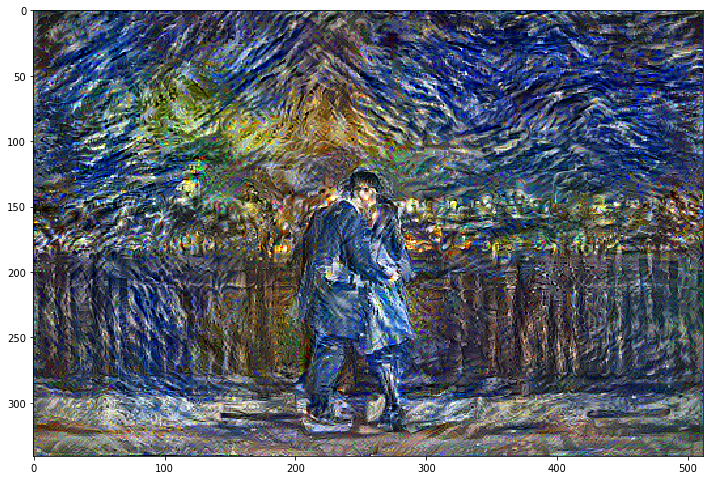

In [49]:
con1_sty1_epo10_path = tf.keras.utils.get_file('epoch10.jpg', 'https://drive.google.com/uc?export=view&id=1dPAfRV6GwU-o9IqIKvNtnrvVGmtnaOS8')
con1_sty1_epo10_image = img_load(con1_sty1_epo10_path)
img_display(con1_sty1_epo10_image)

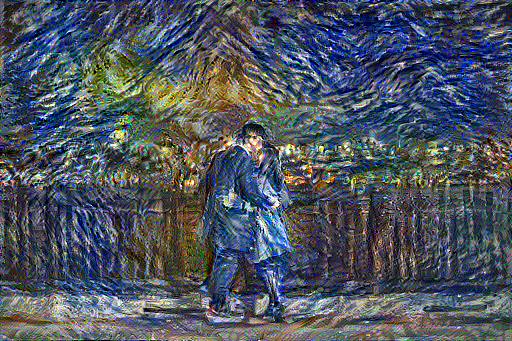

Train step: 1000
Total time: 5749.3


In [60]:
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**1-2) EPOCHES=5**

It is still hard to distinguish two images after setting the epoches to 5. But we can see little differences if we look at the images closely. Second image is brighter than the first image.

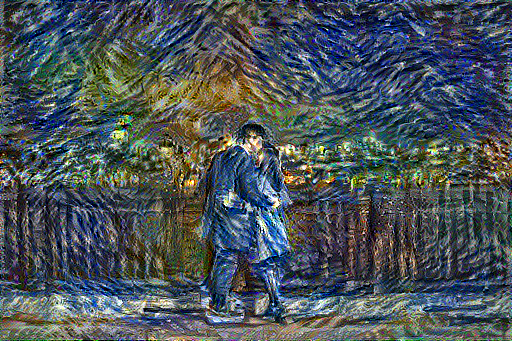

Train step: 500
Total time: 2309.8


In [22]:
# content image 1 + style image 1
start = time.time()

epochs = 5
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

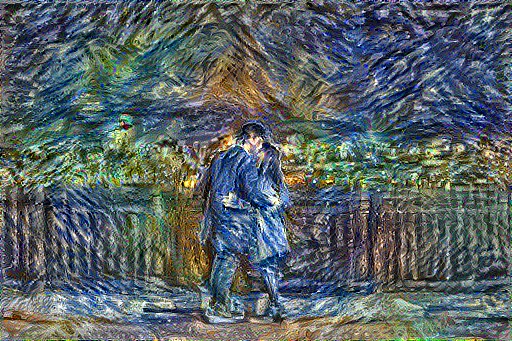

Train step: 500
Total time: 2301.1


In [23]:
# content image 1 + style image 1
start = time.time()

epochs = 5
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**1-3) EPOCHES=1**

Now we can tell the differences between two images after setting the epoches to 1. We can clearly see that color of two images are different. 

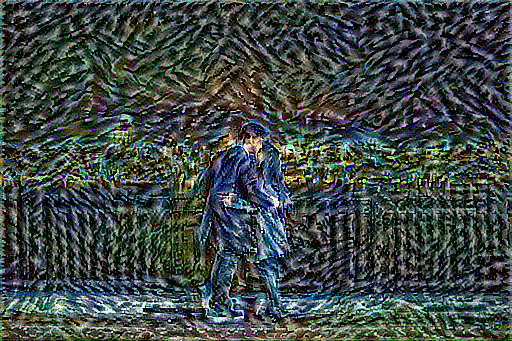

Train step: 100
Total time: 460.4


In [25]:
# content image 1 + style image 1
start = time.time()

epochs = 1
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

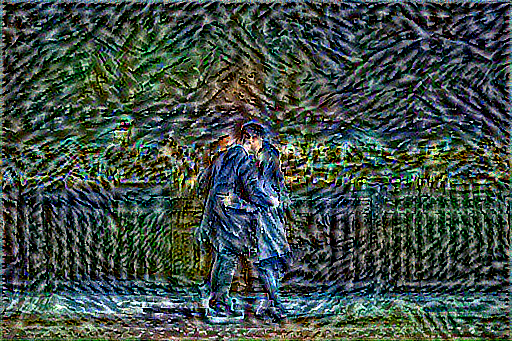

Train step: 100
Total time: 460.3


In [26]:
# content image 1 + style image 1
start = time.time()

epochs = 1
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**Conclusion**

As we put more steps for the total training procedure, generated images are very similar to each other regardless of seed numbers. However, we can easily see the differences between the generated images with different random seeds.

###**2) Different Training Iteration**

**2-1) 100, Training Iteration**



483328/479763 [==============================] - 0s 0us/step


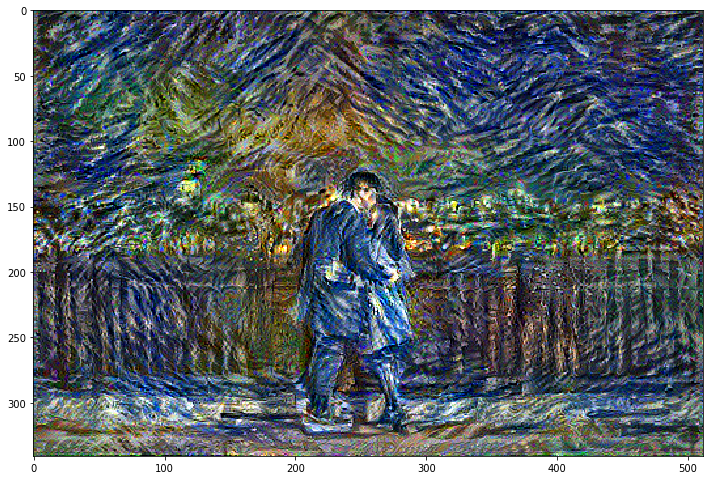

In [50]:
# content image 1 + style image 1
con1_sty1_step100_path = tf.keras.utils.get_file('step100.jpg', 'https://drive.google.com/uc?export=view&id=1SgutkhTzVaipjUyNsrO7jLsrvcHer2l7')
con1_sty1_step100_image = img_load(con1_sty1_step100_path)
img_display(con1_sty1_step100_image)

**2-2) 75, Training Iteration**

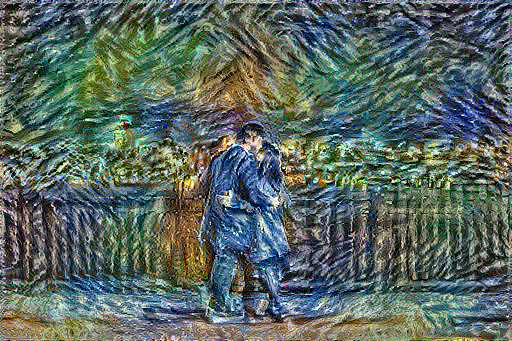

Train step: 375
Total time: 1731.5


In [27]:
# content image 1 + style image 1
start = time.time()

epochs = 5
steps_per_epoch = 75

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**2-3) 50, Training Iteration**

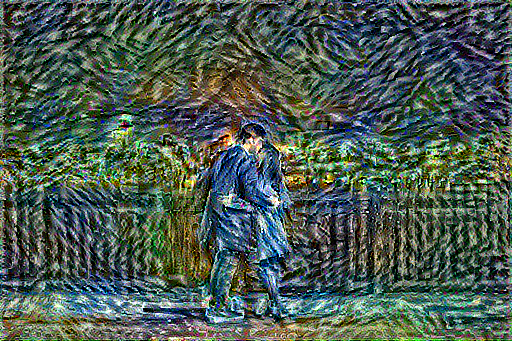

Train step: 250
Total time: 1155.9


In [28]:
# content image 1 + style image 1
start = time.time()

epochs = 5
steps_per_epoch = 50

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**2-4) 25, Training Iteration**

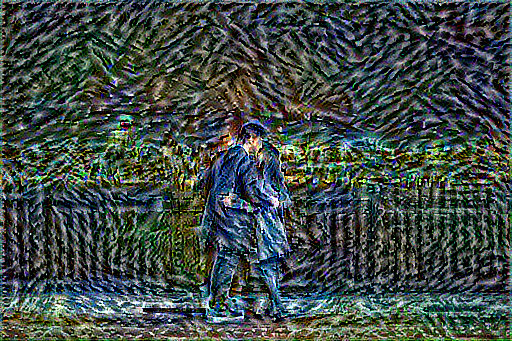

Train step: 125
Total time: 579.2


In [29]:
# content image 1 + style image 1
start = time.time()

epochs = 5
steps_per_epoch = 25

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**Conclusion**

The content image and style reference image get blended better as we increase the training iteration.

### **3) Relative weight of the loss function**

**3-1) Style weight$=10^{-3}$ / Content weight$=10^5$**

In [0]:
style_wgh=1e-3
content_wgh=1e5

def style_content_loss(outputs, style_targets, content_targets):
    s_outputs = outputs['style']
    style_loss = tf.add_n([tf.reduce_mean((s_outputs[name]-style_targets[name])**2) 
                           for name in s_outputs.keys()])
    style_loss *= style_wgh / num_style_layers

    c_outputs = outputs['content']
    content_loss = tf.add_n([tf.reduce_mean((c_outputs[name]-content_targets[name])**2) 
                             for name in c_outputs.keys()])
    content_loss *= content_wgh / num_content_layer
    loss = style_loss + content_loss
    return loss

@tf.function()
def train_step(img, style_targets, content_targets):
  with tf.GradientTape() as tape:
    outputs = extract_layer_values(img)
    loss = style_content_loss(outputs, style_targets, content_targets)

  gradient_descent = tape.gradient(loss, img)
  adam_optimizer.apply_gradients([(gradient_descent, img)])
  img.assign(float_0to1(img))    

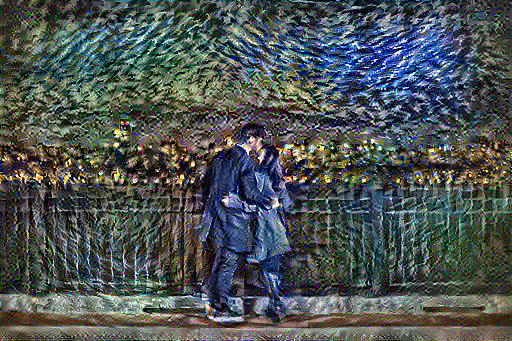

Train step: 500
Total time: 2312.0


In [31]:
# content image 1 + style image 1
start = time.time()

epochs = 5
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**3-2) Style weight$=10^{-2}$ / Content weight$=10^4$**

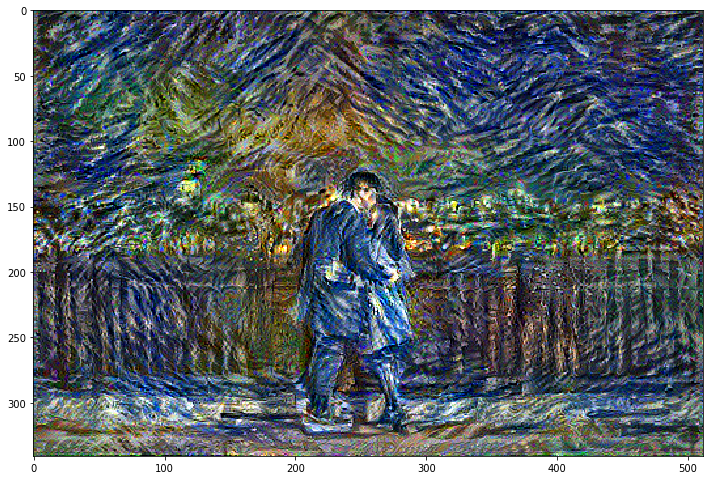

In [51]:
img_display(con1_sty1_step100_image)

**3-3) Style weight$=10^{-1}$ / Content weight$=10^3$**

In [0]:
style_wgh=1e-1
content_wgh=1e3

def style_content_loss(outputs, style_targets, content_targets):
    s_outputs = outputs['style']
    style_loss = tf.add_n([tf.reduce_mean((s_outputs[name]-style_targets[name])**2) 
                           for name in s_outputs.keys()])
    style_loss *= style_wgh / num_style_layers

    c_outputs = outputs['content']
    content_loss = tf.add_n([tf.reduce_mean((c_outputs[name]-content_targets[name])**2) 
                             for name in c_outputs.keys()])
    content_loss *= content_wgh / num_content_layer
    loss = style_loss + content_loss
    return loss

@tf.function()
def train_step(img, style_targets, content_targets):
  with tf.GradientTape() as tape:
    outputs = extract_layer_values(img)
    loss = style_content_loss(outputs, style_targets, content_targets)

  gradient_descent = tape.gradient(loss, img)
  adam_optimizer.apply_gradients([(gradient_descent, img)])
  img.assign(float_0to1(img))    

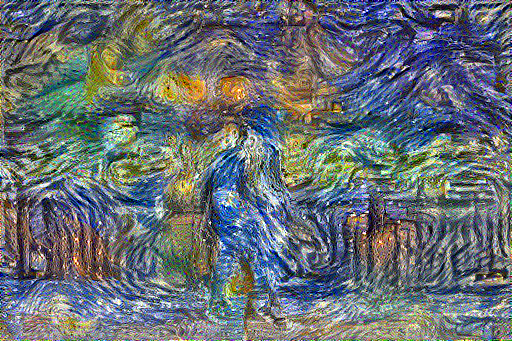

Train step: 500
Total time: 2336.5


In [33]:
# content image 1 + style image 1
start = time.time()

epochs = 5
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

**Conclusion**

Relative weight of the loss function affects the result image the most among the three factors we have tested. As we decrease the content loss weight and increase the style loss weight, shapes of the objects in the content image crumble.

## **1-5. Total variation loss**

One downside to this basic implementation is that it produces a lot of high frequency artifacts. We can decrease these using an explicit regularization term on the high frequency components of the image. This technique is called the total variation loss.

In [0]:
def high_pass_x_y(img):
  x_var = img[:,:,1:,:] - img[:,:,:-1,:]
  y_var = img[:,1:,:,:] - img[:,:-1,:,:]
  return x_var, y_var

High frequency component is basically an edge-detector. Below results show how the high frequency components have increased. 

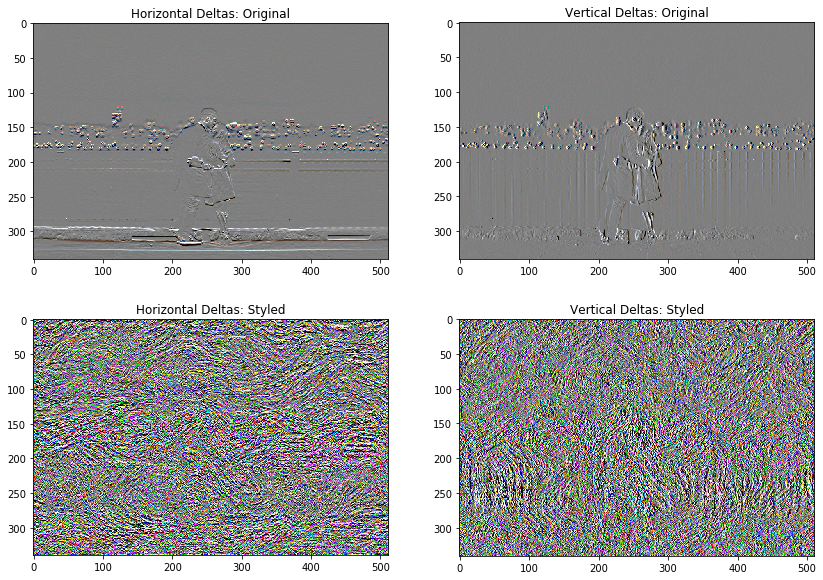

In [36]:
x_deltas1, y_deltas1 = high_pass_x_y(content_image1)

plt.figure(figsize=(14,10))
plt.subplot(221)
img_display(float_0to1(2*y_deltas1+0.5), "Horizontal Deltas: Original")

plt.subplot(222)
img_display(float_0to1(2*x_deltas1+0.5), "Vertical Deltas: Original")

x_deltas1, y_deltas1 = high_pass_x_y(image1)

plt.subplot(223)
img_display(float_0to1(2*y_deltas1+0.5), "Horizontal Deltas: Styled")

plt.subplot(224)
img_display(float_0to1(2*x_deltas1+0.5), "Vertical Deltas: Styled")

The regularization loss to decrease high frequency artifacts.

In [37]:
# TensorFlow has this regularization technique
tf.image.total_variation(image1).numpy() 

array([164252.53], dtype=float32)

### **1-5-1. Re-run the optimization**

In [0]:
# reset
style_wgh=1e-2
content_wgh=1e4

def style_content_loss(outputs, style_targets, content_targets):
    s_outputs = outputs['style']
    style_loss = tf.add_n([tf.reduce_mean((s_outputs[name]-style_targets[name])**2) 
                           for name in s_outputs.keys()])
    style_loss *= style_wgh / num_style_layers

    c_outputs = outputs['content']
    content_loss = tf.add_n([tf.reduce_mean((c_outputs[name]-content_targets[name])**2) 
                             for name in c_outputs.keys()])
    content_loss *= content_wgh / num_content_layer
    loss = style_loss + content_loss
    return loss

@tf.function()
def train_step(img, style_targets, content_targets):
  with tf.GradientTape() as tape:
    outputs = extract_layer_values(img)
    loss = style_content_loss(outputs, style_targets, content_targets)

  gradient_descent = tape.gradient(loss, img)
  adam_optimizer.apply_gradients([(gradient_descent, img)])
  img.assign(float_0to1(img))

In [0]:
# Choose a weight for the total_variation_loss
total_variation_weight=30

In [0]:
@tf.function()
def train_step_variation_loss(image, style_targets, content_targets):
  with tf.GradientTape() as tape:
    outputs = extract_layer_values(image)
    loss = style_content_loss(outputs, style_targets, content_targets)
    loss += total_variation_weight*tf.image.total_variation(image)

  gradient_descent = tape.gradient(loss, image)
  adam_optimizer.apply_gradients([(gradient_descent, image)])
  image.assign(float_0to1(image))

# Reinitialize the optimization variable:
re_image1 = tf.Variable(content_image1)

### **1-5-2. Total variation loss: Final Result**

### **Content Image1 + Style Image1**

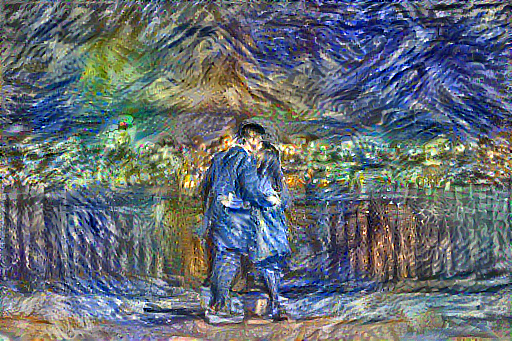

Train step: 500
Total time: 2356.6


In [48]:
# content image 1 + style image 1
import time
start = time.time()

epochs = 5
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_variation_loss(image1, style_targets1, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

### **Content Image1 + Style Image2**

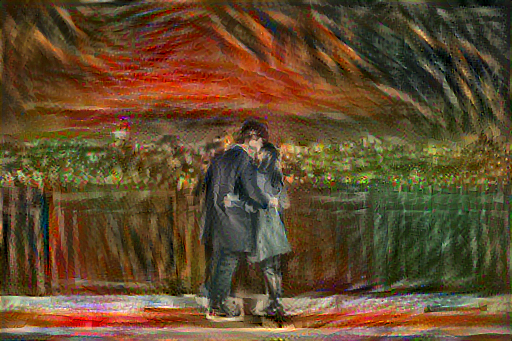

Train step: 500
Total time: 3060.9


In [95]:
# content image 1 + style image 2
import time
start = time.time()

epochs = 5
steps_per_epoch = 100

image1 = tf.Variable(content_image1)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_variation_loss(image1, style_targets2, content_targets1)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image1))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

### **Content Image2 + Style Image1**

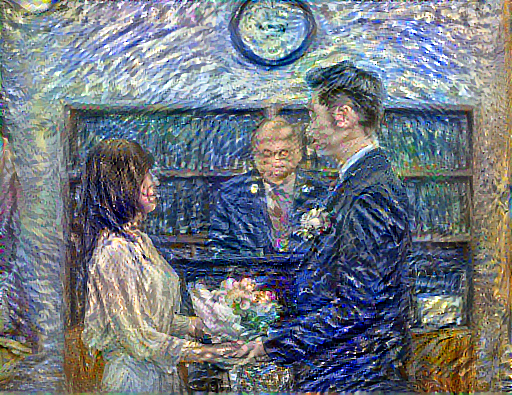

Train step: 500
Total time: 3368.8


In [35]:
# content image 2 + style image 1
import time
start = time.time()

epochs = 5
steps_per_epoch = 100

image2 = tf.Variable(content_image2)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_variation_loss(image2, style_targets1, content_targets2)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image2))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

### **Content Image2 + Style Image2**

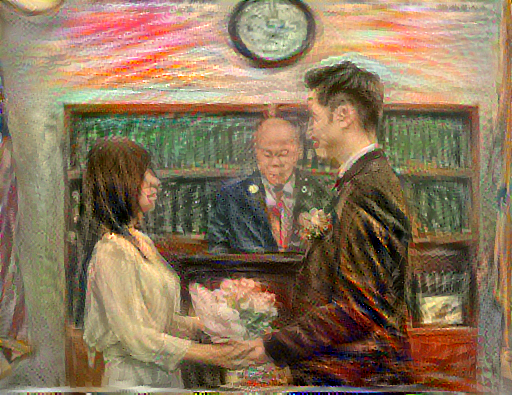

Train step: 500
Total time: 3354.7


In [36]:
# content image 2 + style image 2
import time
start = time.time()

epochs = 5
steps_per_epoch = 100

image2 = tf.Variable(content_image2)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_variation_loss(image2, style_targets2, content_targets2)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image2))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

### **Content Image3 + Style Image1**

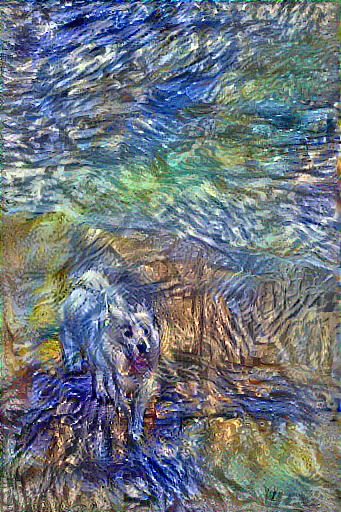

Train step: 500
Total time: 2337.1


In [41]:
# content image 2 + style image 2
import time
start = time.time()

epochs = 5
steps_per_epoch = 100

image3 = tf.Variable(content_image3)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_variation_loss(image3, style_targets1, content_targets3)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image3))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

### **Content Image3 + Style Image2**

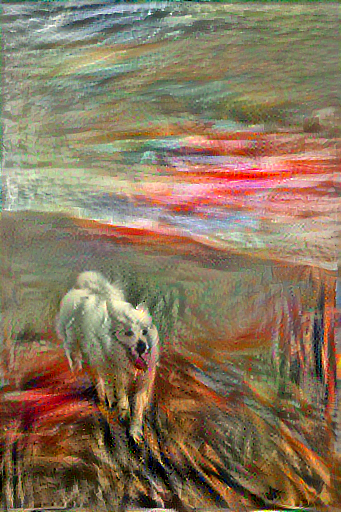

Train step: 500
Total time: 2353.8


In [42]:
# content image 2 + style image 2
import time
start = time.time()

epochs = 5
steps_per_epoch = 100

image3 = tf.Variable(content_image3)

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step_variation_loss(image3, style_targets2, content_targets3)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(ten_img(image3))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

#**2. Style Transfer using Cycle GAN**

Style Transfer using Cycle GAN method can be done without GPU. However, it takes tremendous time to train and obtain the result image without a help of GPU. Therefore, we will try a single image to learn what Cycle GAN's Style Transfer can do by following steps of  [Unpaired Image-to-Image Translation
using Cycle-Consistent Adversarial Networks](https://arxiv.org/pdf/1703.10593.pdf) (Zhu et al.).

### **Cycle GAN**

CycleGAN uses a cycle consistency loss to enable training without the need for paired data. In other words, it can translate from one domain to another without a one-to-one mapping between the source and target domain.

##**2-1. Setup**

Install the `tensorflow_examples` package that enables importing of the generator and the discriminator.

In [3]:
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-xml3l3f6
  Running command git clone -q https://github.com/tensorflow/examples.git /tmp/pip-req-build-xml3l3f6
  Created wheel for tensorflow-examples: filename=tensorflow_examples-61bb8c2d6c198573519b89da55bb057d7cbe9385_-cp36-none-any.whl size=74922 sha256=2a1d146b31b1277b696edf741110765e772516f63aa1dc54392b943f0f929b38
  Stored in directory: /tmp/pip-ephem-wheel-cache-7ct60tqi/wheels/83/64/b3/4cfa02dc6f9d16bf7257892c6a7ec602cd7e0ff6ec4d7d714d
Successfully built tensorflow-examples


In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
from IPython.display import clear_output

tfds.disable_progress_bar()
AUTOTUNE = tf.data.experimental.AUTOTUNE

## **2-2. Loading Data**

Unlike style transfer using VGG19 network, this process requires a training data set as this method does the style transfer without the paired image (we need to train a source of the style).

Before training, we will apply random jittering and mirroring to the training dataset. These are some of the image augmentation techniques that avoids overfitting. This is similar to what was done in pix2pix. In random jittering, the image is resized to 286 x 286 and then randomly cropped to 256 x 256. In random mirroring, the image is randomly flipped horizontally i.e left to right.

Load the data from TensorFlow Datasets.

In [5]:
dataset, metadata = tfds.load('cycle_gan/horse2zebra',
                              with_info=True, as_supervised=True)
train_h, train_z = dataset['trainA'], dataset['trainB']
test_h, test_z = dataset['testA'], dataset['testB']

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/horse2zebra/0.1.0. Subsequent calls will reuse this data.


### **Preprocessing**

Randomly crop the image to 256x256.

In [0]:
IMG_WIDTH = 256
IMG_HEIGHT = 256

def crop_img(img):
  new_img = tf.image.random_crop(img, size=[IMG_HEIGHT, IMG_WIDTH, 3])
  return new_img

Normalize the images to [-1, 1].

In [0]:
def norm_img(img):
  img = tf.cast(img, tf.float32)
  img = (img/127.5)-1
  return img

Apply random jittering and mirroring.

In [0]:
def random_jitter_mirror(img):
  # resize the img to 286x286x3
  img = tf.image.resize(img, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  # crop the img
  img = crop_img(img)
  # random mirroring (flip horizontally)
  img = tf.image.random_flip_left_right(img)
  return img

Define a function that merges the preprocessing steps.

In [0]:
# Training set requires random jitter and mirroring to avoid overfitting
def pre_train(img, lab):
  img = random_jitter_mirror(img)
  img = norm_img(img)
  return img

# Test set doesn't require random jitter and mirroring as it is not related to overfitting
def pre_test(img, lab):
  img = norm_img(img)
  return img  

Apply preprocessing to the datasets.

In [0]:
train_h = train_h.map(pre_train, num_parallel_calls=AUTOTUNE).cache().shuffle(1000).batch(1)
train_z = train_z.map(pre_train, num_parallel_calls=AUTOTUNE).cache().shuffle(1000).batch(1)

test_h = test_h.map(pre_test, num_parallel_calls=AUTOTUNE).cache().shuffle(1000).batch(1)
test_z = test_z.map(pre_test, num_parallel_calls=AUTOTUNE).cache().shuffle(1000).batch(1)

In [0]:
samp_h = next(iter(train_h))
samp_z = next(iter(train_z))

### **1st time preprocessed Image vs 2nd time preprocessed Image**



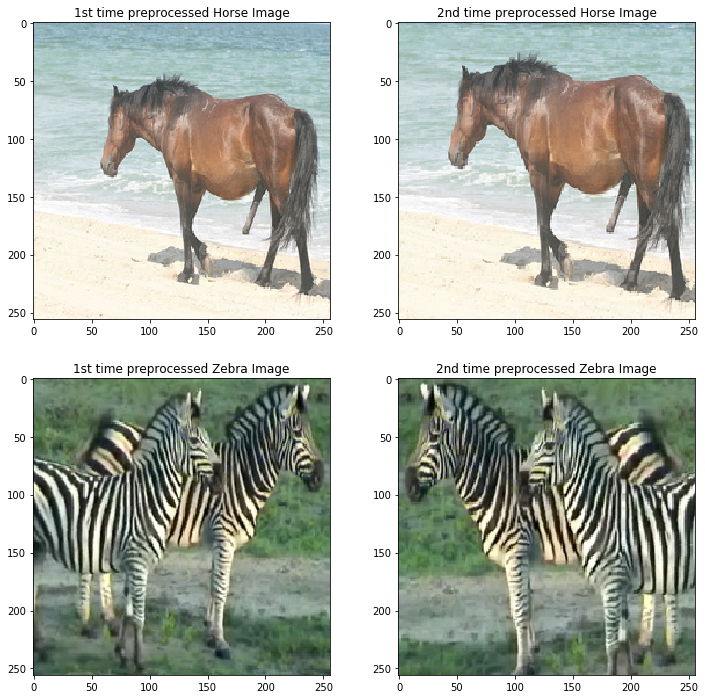

In [16]:
plt.subplot(221)
plt.title('1st time preprocessed Horse Image')
plt.imshow(samp_h[0]*0.5+0.5)

plt.subplot(222)
plt.title('2nd time preprocessed Horse Image')
plt.imshow(random_jitter_mirror(samp_h[0])*0.5+0.5)

plt.subplot(223)
plt.title('1st time preprocessed Zebra Image')
plt.imshow(samp_z[0]*0.5+0.5)

plt.subplot(224)
plt.title('2nd time preprocessed Zebra Image')
plt.imshow(random_jitter_mirror(samp_z[0])*0.5+0.5)

## **2-3. Generator and Discriminator**

There are two generators ($G\  and\ F$) and two discriminators ($D_X\ and\ D_Y$) being trained for CycleGAN. 

Generator $G$ learns to transform image $X$ to image $Y$. $(G: X \rightarrow Y)$

Generator $F$ learns to transform image $Y$ to image $X$. $(F: Y \rightarrow X)$

Discriminator $D_X$ learns to differentiate between image $X$ and generated image $X=F(Y)$.

Discriminator $D_Y$ learns to differentiate between image $Y$ and generated image $Y=G(X)$.

In [0]:
gen_g = pix2pix.unet_generator(3, norm_type='instancenorm') # output channel is 3
gen_f = pix2pix.unet_generator(3, norm_type='instancenorm')

discrim_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discrim_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

## **2-4. Loss functions**

CycleGAN does not use paired data to train. Therefore, we cannot be sure that the input $x$ and the target $y$ are a good pair for training. Thus, to check whether the input and the target images are a good pair, we will use **cycle consistency loss**.

In [0]:
lamb = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def discrim_loss(original, gen):
  ori_loss = loss_obj(tf.ones_like(original), original)
  gen_loss = loss_obj(tf.zeros_like(gen), gen)
  discrim_loss = ori_loss + gen_loss
  return discrim_loss*0.5

In [0]:
def gen_loss(gen):
  return loss_obj(tf.ones_like(gen), gen)

###**2-4-1. Cycle consistency loss** 

**Cycle consistency** means how much the result is close to the original input. For instance, if we translate a sentence from English to French and then translate back from French to English, the final translated sentence should be the same as the  original sentence.

To calculae **cycle consistency** loss, 

* Transform image $X$ to generated image $\hat{Y}$ using generator $G$.
* Transform image $\hat{Y}$ to generated image $\hat{X}$ using generator $F$.
* Calculate mean absolute error between $X$ and $\hat{X}$.

* Forward cycle consistency loss: $$X \rightarrow G(X) \rightarrow F(G(X)) \sim \hat{X}$$

* Backward cycle consistency loss: $$Y \rightarrow F(Y) \rightarrow G(F(Y)) \sim \hat{Y}$$

![Cycle loss](https://drive.google.com/uc?id=1AUIc9jM231jkJsyZv5gI5N8lf9ldz_xM)

In [0]:
def cycle_con_loss(r_img, c_img):
  loss = tf.reduce_mean(tf.abs(r_img-c_img))
  return lamb*loss

### **2-4-2. Identity loss**

Since generator $G$ translates images to image $Y$, if we feed image $Y$ to generator $G$, we would expect to get image something close to image $Y$ (same for $X$ and generator $F$). Therefore, we calculate **identity loss** by,

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [0]:
def identity_loss(r_img, gen_img):
  loss = tf.reduce_mean(tf.abs(r_img-gen_img))
  return 0.5*lamb*loss

Initialize the optimizers for all the generators and the discriminators. We use the same optimizer as the first part of the project, **Adam**.

In [0]:
gen_g_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
gen_f_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discrim_x_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discrim_y_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

**Setting Checkpoints**

In [0]:
checkpoint_path = "./checkpoints/train"

check_point = tf.train.Checkpoint(gen_g=gen_g,
                                  gen_f=gen_f,
                                  discrim_x=discrim_x,
                                  discrim_y=discrim_y,
                                  gen_g_opt=gen_g_opt,
                                  gen_f_opt=gen_f_opt,
                                  discrim_x_opt=discrim_x_opt,
                                  discrim_y_opt=discrim_y_opt)

check_point_manager = tf.train.CheckpointManager(check_point, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if check_point_manager.latest_checkpoint:
  check_point.restore(check_point_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

## **2-5. Training the model**

Although, the paper sets epochs to 200, since it takes tremendous time with my computer, I will set epoch to 20.

In [0]:
def generate_img(model, test):
  generated_img = model(test)
  show = [test[0], generated_img[0]]
  title = ['Input Image', 'Generated Image']
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(show[i]*0.5+0.5)
  plt.show()

**Steps of the Training process**

1. Get generated image
2. Calculate the loss
3. Calculate the gradients
4. Apply the gradients to the optimizer

In [0]:
@tf.function
def train_step_CycleGAN(x, y):
  with tf.GradientTape(persistent=True) as tape:
  # Step 1 + 2:
    # gen_y : G(x) / gen_x : F(y)
    # double_gen_x : F(G(x))) / double_gen_y : G(F(y))
    gen_y = gen_g(x, training=True)
    double_gen_x = gen_f(gen_y, training=True)
    
    gen_x = gen_f(y, training=True)
    double_gen_y = gen_g(gen_x, training=True)

    # iden_x : F(x) / iden_y : G(y)
    iden_x = gen_f(x, training=True)
    iden_y = gen_g(y, training=True)

    dis_x = discrim_x(x, training=True)
    dis_y = discrim_y(y, training=True)

    dis_gen_x = discrim_x(gen_x, training=True)
    dis_gen_y = discrim_y(gen_y, training=True)

    # calculate the loss
    gen_g_loss = gen_loss(dis_gen_y)
    gen_f_loss = gen_loss(dis_gen_x)
    
    # cycle consistency loss
    tot_cycle_con_loss = cycle_con_loss(x, double_gen_x) + cycle_con_loss(y, double_gen_y)
    
    # Total generator loss = Generator loss + cycle consistency loss + identity loss
    # G : X -> Y / F : Y -> X
    total_gen_g_loss = gen_g_loss + tot_cycle_con_loss + identity_loss(y, iden_y)
    total_gen_f_loss = gen_f_loss + tot_cycle_con_loss + identity_loss(x, iden_x)

    # Discriminator loss
    dis_x_loss = discrim_loss(dis_x, dis_gen_x)
    dis_y_loss = discrim_loss(dis_y, dis_gen_y)

  #############################################################################

  # Step 3
  # Calculate the gradients
  gen_g_gradients = tape.gradient(total_gen_g_loss, gen_g.trainable_variables)
  gen_f_gradients = tape.gradient(total_gen_f_loss, gen_f.trainable_variables)
  
  discrim_x_gradients = tape.gradient(dis_x_loss, discrim_x.trainable_variables)
  discrim_y_gradients = tape.gradient(dis_y_loss, discrim_y.trainable_variables)
  
  #############################################################################

  # Step 4
  # Apply the gradients to the optimizer
  gen_g_opt.apply_gradients(zip(gen_g_gradients, gen_g.trainable_variables))
  gen_f_opt.apply_gradients(zip(gen_f_gradients, gen_f.trainable_variables))
  
  discrim_x_opt.apply_gradients(zip(discrim_x_gradients, discrim_x.trainable_variables))
  discrim_y_opt.apply_gradients(zip(discrim_y_gradients, discrim_y.trainable_variables))

## **2-6. CycleGAN Result**

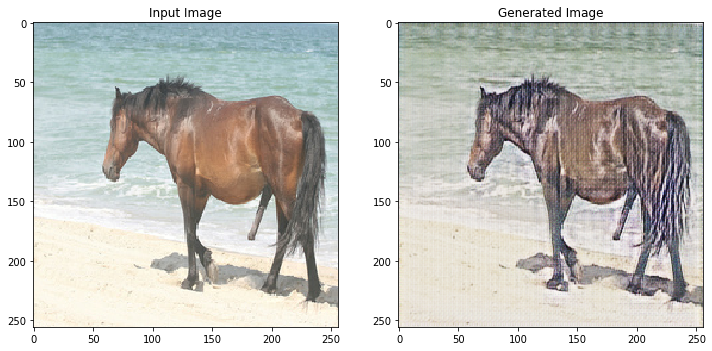

Time taken for epoch 3 is 11106.015148639679 sec

...................................................................................................

In [0]:
for epoch in range(20):
  start = time.time()

  n = 0
  for x, y in tf.data.Dataset.zip((train_h, train_z)):
    train_step_CycleGAN(x, y)
    if n % 10 == 0:
      print ('.', end='')
    n+=1

  clear_output(wait=True)
  generate_img(gen_g, samp_h)

  if (epoch + 1) % 5 == 0:
    check_point_save_path = check_point_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         check_point_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))